In [1]:
# Loading libraries
import numpy as np
import copy
import matplotlib.pyplot as plt
from IPython.display import HTML
import seaborn as sns
from matplotlib import animation
import itertools
import pandas as pd
from math import sqrt

seed_val = 0
np.random.seed(seed_val)

import warnings
warnings.filterwarnings('ignore')

# Compartmental SIR Modeling with population movement across communities
This part models the spread of Covid-19 through a SIR model over a geometric region using a transition probability matrix representing the movement of people from one geometric community to another. The idea of the people movement is based on the Markov chain and the movement will only depend on their current location. We tried to incorporate the travel dynamics of individuals in the region to study how this may affect the spread of disease. By updating the transition probability matrix, different experiments were tried by mirroring the social distancing, complete lockdown, partial lockdown, or situation where only the most visited places are either locked or allowed to visit. By combining two such systems (each representing a city joined only through one route), we also modeled how disease spreads across multiple cities.


The SIR model is one of the simplest and most studied compartmental models, and many models are derivatives of this basic form. The model consists of three compartments: S for the number of susceptible, I for the number of infectious, and R for the number of removed (recovered, deceased, or immune) individuals. The count of individuals in each of the three states in a time are stored in variables S, I, and R.

SIR model is dynamic in the sense that the count of individuals in the three states changes over time. Our method increases this dynamic nature by enabling the movement of individuals from one community to another.

We modeled the SIR without vital dynamics, that is, no birth or death other than from the disease itself is considered, making total population constant. One idea behind this is that the dynamics of disease like Covid-19 is much faster than the dynamics of birth and death.


> *S + I + R = N (constant)*

The SIR model can be defined as the set of three Ordinary Differential Equations:

> \begin{equation*}
\frac{ds\left(t\right)}{dt}=-b s\left(t\right)i\left(t\right)\\
\frac{di\left(t\right)}{dt}=b s\left(t\right)i\left(t\right)-k i\left(t\right)\\
\frac{dr\left(t\right)}{dt}=k i\left(t\right)
\end{equation*}

Where, $s(t), i(t), r(t)$ are the susceptible, infected and removed fraction of the population at time $t$. $s(t)=\frac{S(t)}{N}$ and so on. $b$ is the infection rate and $k$ is the recovery rate.

One thing to note is that since we are modeling without vital dynamic, sum of three ODE is 0 representing no new addition or deletion of population from outside
> \begin{equation*}
\frac{ds\left(t\right)}{dt} + \frac{di\left(t\right)}{dt} + \frac{dr\left(t\right)}{dt} = 0
\end{equation*}









## Values of infection and recovery rate?

We tried to estimate the values of infection and recovery rate for the SIR model statistically using the original Covid-19 data from HDX [1]. Using grid search over both the rates we found the optimal rates which minimized the RMSE error between modeled and original counts (both infections and removed). We also used the following assumptions:

1.   Since we are considering $R$ state as both recovered and died, we added the deaths and recovered counts into one value
2.   We selected Germany data because: 
    *   Germany has crossed the peak infections point and active infection count is going down for the last 1 month [2]
    *   Germany also has one of largest test counts and started testing and recording data from patient 1

3.   Since all the patients usually get infected in our model, we decided to keep the initial $S$ as total infections to date
4.   Both the error in infections and recovered was given equal weights while calculating RMSE
5.   Since at a time, $N = S(t) + I(t) + R(t)$, and the original data has total confirmed cases at each day (which also includes recovered or dead patients), we calculated $I(t)$ from model by taking $N - S(t)$. This is same as $I(t)+R(t)$



In [2]:
# Data loading (source: https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases)
infect=pd.read_csv("time_series_covid19_confirmed_global.csv")
recover=pd.read_csv("time_series_covid19_recovered_global.csv")
dead=pd.read_csv("time_series_covid19_deaths_global.csv")

infect = infect[infect['Country/Region'] == 'Germany']
recover = recover[recover['Country/Region'] == 'Germany']
dead = dead[dead['Country/Region'] == 'Germany']

# Filtering from time when Germany had its first patient
START_DATE = '1/27/20'

infect = infect.iloc[0].loc[START_DATE:]
recover = recover.iloc[0].loc[START_DATE:]
dead = dead.iloc[0].loc[START_DATE:]

recover = dead+recover # adding dead and recovered as R state
time = len(infect) # duration of simulation
N = infect[-1] # Population size

In [3]:
def predict_SIR(b, k, N, time):
    """
    This function runs a simple SIR model and outputs S,I and R lists
    """
    
    S_ = (N-1)/N
    I_ = 1/N
    R_ = 0
    
    S = [S_*N]
    I = [I_*N]
    R = [R_*N]
    
    for i in range(time-1):
        new_infect = b*S_*I_
        new_recovered = k*I_
        S_ = S_ - new_infect
        I_ = I_ + new_infect - new_recovered
        R_ = R_ + new_recovered

        S.append(S_*N)
        I.append(I_*N)
        R.append(R_*N)
    return(S, I, R)
        
def RMSE_SIR(S,I,R,recover,infect,N, time):
    """
    Function to calculate sum of RMSE of infections and predictions
    Input:
        S,I,R: modeled values
        recover, infect: original values
    """
    # calculating actual Infected which also includes Recovered
    I= N-np.array(S)
    
    c1 = sqrt(sum((R-recover)**2)/time)
    c2 = sqrt(sum((infect-I)**2)/time)
    return(c1+c2)

In [4]:
# Running grid search
blist = np.linspace(0.2,0.5,30) # grid over infection rate
klist = np.linspace(0.01,0.3,30) # grid over recovery rate
result = np.zeros((len(blist)*len(klist), 3))
counter=0
for b in blist:
    for k in klist:
        S, I, R = predict_SIR(b, k, N, time)
        rmse = RMSE_SIR(S,I,R,recover,infect,N,time)
        result[counter]=[b,k,rmse]
        counter+=1

resultdf = pd.DataFrame(result)
idx = resultdf[2].argmin()

print("Estimated Infection rate: "+str(round(result[idx][0], 4)))
print("Estimated Recovery rate: "+str(round(result[idx][1],4)))

Estimated Infection rate: 0.2621
Estimated Recovery rate: 0.07


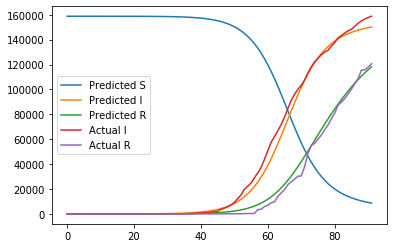

In [5]:
# Plotting the predicted vs actual counts

# Predicting with optimal parameters
S, I, R = predict_SIR(result[idx][0], result[idx][1], N, time)

x = list(range(time))
plt.plot(x, S, label="Predicted S")
plt.plot(x, N-np.array(S), label="Predicted I")
plt.plot(x, R, label="Predicted R")
plt.plot(x, list(infect), label="Actual I")
plt.plot(x, list(recover), label="Actual R")
plt.legend(loc="center left")

Observations from the above analysis:


1.   The parameters were estimates as $b=0.2621$ and $k=0.07$. This means that the average day a patient remains in the infection state is around 2 weeks ($\frac{1}{0.07}$). Which aligns with the actual range of recovery duration [3]
2.   The $R0$ value or the Basic reproduction number of Covid-19 is $\frac{b}{k}=3.74$. While the expected actual value is 1.4–5.7 [4]
3.   The plot of Predicted and Actual counts are highly correlated and aligns with each other

Based on the above points we can conclude that the estimated rates can be considered for our study.







## Functions required in the modelling

In [6]:
def get_neighbors(city_map, ind, max_jump):
    """
    This function finds the neighbour communities of a given community.
    city_map is considered as a layout of the city representing how differenting
    communities are placed in the city

    Input
    -----
        city_map: a numpy 2D array showing the layout of city in grid format
        ind: index of community for which neighbors are to be found
        max_jump: how many communities in each side are to be considered as 
                  neighbor. 1 means only the closest 8 will be considered

    Output
    ------
        out: list of neighbor communities
    """
    np.random.seed(seed_val)
    x = np.where(city_map == ind)
    row = x[0][0]
    col = x[1][0]
    
    row_ = np.array((range(row-max_jump, row+max_jump+1)))
    col_ = np.array(list(range(col-max_jump, col+max_jump+1)))
    
    row_ = row_[(row_ >= 0) & (row_ < city_map.shape[0])]
    col_ = col_[(col_ >= 0) & (col_ < city_map.shape[1])]
    
    neighbors = list(itertools.product(*[row_, col_]))
    
    out = []
    for n in neighbors:
        out.append(city_map[n[0], n[1]])
    
    return out

def generate_TM(loc, city_map):
    """
    This function creates a transition probabilty matrix. Individuals will follow this 
    to move from one location to another.

    One indivudal can move among loc/2 locations. This assumption is made considering a individual doesn't
    visit all the locations in a city

    This will be updated to more realistic number later.

    Input
    -----
        loc: Number of locations 
        city_map: city grid (2D array) with values as locatin ID

    Output:
    -------
        TM: Transition probability matrix
    """
    np.random.seed(0)
    n = len(loc)
    TM=np.zeros((n, n))
    for i in loc:
        to = get_neighbors(city_map, i, 2)
        
        # adding 1 random jumps
        nonneighbor = list(set(list(range(0, n))) - set(to))
        nonneighbor = np.random.choice(nonneighbor, 1)
        for z in nonneighbor:
            to.append(z)
        
        TM[i,to]=np.random.randint(10,1000,size=len(to))
    TM = TM/TM.sum(axis=1)[:,None]  
    return(TM)

# Function to update the transition probability matrix simulating the lockdown
def get_TM_lockdown(TM, lockdown=0):
    """
    This function updates the transition probabilty matrix. 

    With lockdown = r , it means the diagonal elements will be r keeping all the individual 
    at the same place with 90% probability. Other probabilies are scales to make tie row sum = 1
    Example - lockdown = 0.9 means the diagonal elements will be 0.9

    With 0 locakdown no update in TM

    With 1 lockdown, only diagonal elemets will be > 0 with values of 1

    Input
    -----
        TM: Transition probability matrix
        lockdown: lockdown ratio - 0.9 means 90% people will stay at their original place

    Output:
    -------
        TM: Updated transition probability matrix
    """
    if lockdown==1:
        return(np.diag([1]*len(TM)))
    elif lockdown==0:
        return(TM)
    else:
        diag=np.diag(TM)
        for i in range(len(TM)):
            if diag[i] == 1:
                diag[i] = lockdown
            TM[i,:]=TM[i,:]*(1-lockdown)/(1-diag[i])
            TM[i,i]=lockdown
        return(TM)
    

In [7]:
# def model_SIR(TMatrix, pop, N, b, k, time, loc):
def model_SIR(TMatrix, N, b, k, time, loc, infected_0, init_location):
    """
    This function runs the SIR simulation

    Input
    -----
        TMatrix: Transition probability matrix
        N: Total population size
        b: Infection rate
        k: Recovery rate
        time: Simulation time
        loc: Number of locations (communities)
        infected_0: initial infection count
        inti_location: 'home' location of each individual
        

    Output:
    -------
        S, I, R: Three lists of S, I and R for each time period 
        I_time_ratio: Ratio of infected individual in each community in each time
        I_time: Number of infected individual in each community in each time

    """

    np.random.seed(seed_val)
    # Creating initial population 2D array with columns:
    #   (1) Original location (2) Current location (3) Current state i.e. S/I/R
    pop=np.zeros((3, N))

    # Assigning location to each individual
    pop[0,:]=init_location # original 'home' location
    pop[1,:]=pop[0,:] # current location

    # Infecting random population 
    # (we infected upto 80% in first community and moved to next)
    loc_to_infect = 0
    while infected_0 > 0:
        pop_at_loc = np.where((pop[0,:] == loc_to_infect))[0]
        pop_to_infect = np.random.choice(pop_at_loc, min(infected_0, int(0.8*len(pop_at_loc))), replace=False)
        pop[2, pop_to_infect] = 1
        infected_0 -= len(pop_to_infect)
        loc_to_infect+=1
        
    print("Initial infections complete...")

    Stot = []
    Itot = []
    Rtot = []

    # to store infected count for each location in each time period
    I_time = []
    I_time_ratio = []

    # SIR matrix - will have dimension (3 * number of locations)
    # WIll store - S, I and R count for each location for current time
    SIR = np.zeros((3, loc))
    location_of_pop = np.zeros((N, time))
    for i in range(N):
        # for the i individual, randomly selecting the current location for time = 0
        new = int(np.random.choice(loc, 1, p=TMatrix[int(pop[0,i]),:]))
        SIR[int(pop[2,i]), int(pop[1,i])]+=1

        location_of_pop[i,:] = np.random.choice(loc, time, p=TMatrix[int(pop[0,i]),:])

    I_time_ratio.append(SIR[1,:]/SIR.sum(axis=0)[None,:])
    I_time.append(SIR[1,:])
    
    for t in range(time):
        
        # Moving individuals from one place to another
        for i in range(N):
            # for the i individual, randomly selecting the next destination
            new = int(location_of_pop[i,t])
            # Updating SIR matrix. Increasing the count in new location and decreasing in previous
            SIR[int(pop[2,i]), new]+=1
            SIR[int(pop[2,i]), int(pop[1,i])] -=1
            # Updaging indiviudal current location in pop matrix 
            pop[1,i]=new
            
        SIR_prev=copy.deepcopy(SIR)
        
        inf_loc = np.where(SIR[1,:]>0)[0].tolist() # locations with infected people
        colsum=SIR.sum(axis=0)
        SIR_=copy.deepcopy(SIR)
        SIR=SIR/colsum[None,:]
        SIR[np.isnan(SIR)] = 0
        
        # Updating the S and I counts based on SIR model
        new_infect = b*SIR[1,:]*SIR[0,:]
        new_infect = np.where(new_infect>SIR[0,:], SIR[0,:], new_infect)
        new_infect = np.round(new_infect*colsum)
        
        SIR_[0,:]=SIR_[0,:]-new_infect # removing infected people from S stage
        SIR_[1,:]=SIR_[1,:]+new_infect # adding infected people in I stage
        
        # Updating the R
        new_rec = k*SIR_[1,:]
        new_rec = np.round((new_rec).sum())
        
        while (new_rec > 0):
            idx = np.random.choice(inf_loc, 1)
            if SIR_[1,idx]>0:
                SIR_[2,idx]+=1
                SIR_[1,idx]-=1
                new_rec-=1

        # marking new individual in 'pop' who converted to S, I, R
        diff=SIR_-SIR_prev
        for l in range(loc):
            # S
            if (diff[0,l] < 0):
                idx, = np.where((pop[1,:]==l) & (pop[2,:]==0))
                idx = np.random.choice(idx, int(-diff[0,l]), replace=False)
                pop[2,idx] = 1
            # R
            if (diff[2,l] > 0):
                idx, = np.where((pop[1,:]==l) & (pop[2,:]==1))
                idx = np.random.choice(idx, int(diff[2,l]), replace=False)
                pop[2,idx] = 2

        # taking the total across all the locations
        Stot.append(SIR_[0,:].sum())
        Itot.append(SIR_[1,:].sum())
        Rtot.append(SIR_[2,:].sum())
        SIR_ = np.round(SIR_)
        
        I_time_ratio.append(SIR_[1,:]/SIR_.sum(axis=0)[None,:])
        I_time.append(SIR_[1,:])
        SIR = copy.deepcopy(SIR_)
        
    return(Stot, Itot, Rtot, I_time_ratio, I_time)

In [8]:
def plot_SIR(Stot, Itot, Rtot, N):
    """
    Function to create SIR plot
    Input
    -----
        Stot, Itot, Rtot: Lists of S, I, R repectively
    """
    print("Total people who got infected: " + str(pop_size-Stot[-1]) + "(" + str(round((pop_size-Stot[-1])*100/N, 1))+"%)")
    print("Maximum infections present in a day: " + str(int(np.max(Itot))) + " at day: "+ str(Itot.index(max(Itot))))

    x = list(range(1, len(Stot)+1))
    # Adding lines
    plt.plot(x, Stot, label="S")
    plt.plot(x, Itot, label="I")
    plt.plot(x, Rtot, label="R")
    # Adding legends and labels
    plt.legend(loc="upper right")
    plt.xlabel('Day', fontsize=14)
    plt.ylabel('# People', fontsize=14)
    plt.show()

## Experiments


### 1. Basic SIR model with people movement across communities without any restriction

### Finding the transition probability matrix:

1.   For a location $i$, its neighbors were stored in a list named '$to$'
2.   Then some non-neighbors were randomly selected and added in the same list '$to$'
3.   Random probabilities were assigned to each location present in the list '$to$'. These probabilities were the probabilities of movement from $i$ to these locations in list '$to$'
4.   Step 1-3 was repeated for all the locations

In [9]:
# Parameters selected 
b = 0.2621          # infection rate
k = 0.07            # recovery rate
time = 200          # simulation time
lock = 0            # lockdown (0 means no lockdown)
grid_size = 20      # Hieght and width of city. one cell in grid is one community
pop_size = 20000    # Population size    
infected_0 = 200    # Initial 1% population infected 
locations = grid_size * grid_size

city_map = np.reshape(list(range(locations)), (grid_size, grid_size))

Initial infections complete...
Total people who got infected: 18083.0(90.4%)
Maximum infections present in a day: 2437 at day: 102


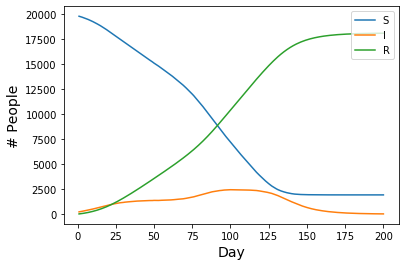

In [10]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO = generate_TM(list(range(locations)), city_map)

# restricting transition in case of lockdown
TMatrix=get_TM_lockdown(TMatrixO.copy(), lock)

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrix, pop_size, b, k, time, locations, infected_0, np.random.choice(locations, pop_size))

# Plots
plot_SIR(Stot, Itot, Rtot, pop_size)

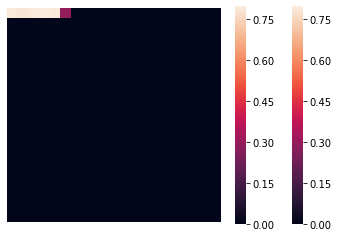

In [11]:
# Animations showing spread of disease in different communities
fig = plt.figure()

def init():
    data = np.reshape(I_time_ratio[0], (grid_size, grid_size))
    sns.heatmap(data, square=True, yticklabels = False, xticklabels=False)

t = 0
def animate(i):
    global t, max_
    data = np.reshape(I_time_ratio[t], (grid_size, grid_size))
    t+=1
    if t >= time:
        t = 0
    sns.heatmap(data, square=True, cbar=False, yticklabels = False, xticklabels=False)
    
anim = animation.FuncAnimation(fig, animate, init_func = init, frames=time, repeat = True)

HTML(anim.to_jshtml())

The above and following heatplots show the fraction of infected individuals in different community at different time

#### **Observation**
Without any restriction, 90% of people got infected in 200 days with maximum active cases of 2437 on day 102. The graph reached its first plateau around day 50. After day 75 the slope again increased and peaked at day 100 (In the animation we can see that the highly infected regions reached the diagonal of the city grid and a new hotspot was created on the top right corner around day 100)

### 2. With 25% lockdown
Now people remained in their homes with a probability of 25% and moved to other communities with a 75% probability. The above randomly generated Transition Probability matrix was updated such that $TM[i, i]=0.25$ while other probabilities were scaled down to make the sum=1.

Initial infections complete...
Total people who got infected: 17597.0(88.0%)
Maximum infections present in a day: 2618 at day: 115


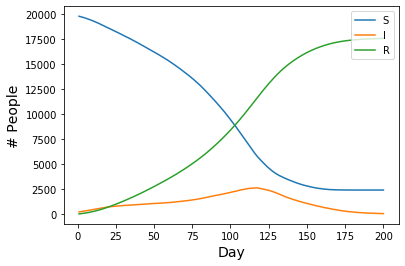

In [12]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO = generate_TM(list(range(locations)), city_map)

# restricting transition in case of lockdown
TMatrix=get_TM_lockdown(TMatrixO.copy(), 0.25)

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrix, pop_size, b, k, time, locations, infected_0, np.random.choice(locations, pop_size))

# Plots
plot_SIR(Stot, Itot, Rtot, pop_size)

#### **Observation**
> 25% lockdown only reduced the total infected by 2% and 88% population still got infected. But the peak of infection reached 13 days later and the plot was flatter. 25% lockdown helped in "Flattening the curve" by a small amount.

### 3. With 50% lockdown
Now people remained in their home with a probability of 50% and moved to other communities with 50% probability.

Initial infections complete...
Total people who got infected: 9818.0(49.1%)
Maximum infections present in a day: 1053 at day: 145


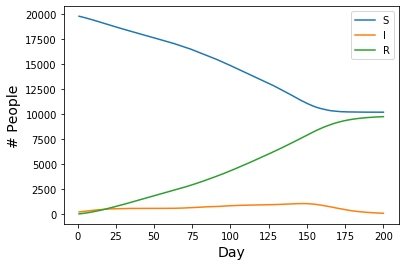

In [13]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO = generate_TM(list(range(locations)), city_map)

# restricting transition in case of lockdown
TMatrix=get_TM_lockdown(TMatrixO.copy(), 0.5)

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrix, pop_size, b, k, time, locations, infected_0, np.random.choice(locations, pop_size))

# Plots
plot_SIR(Stot, Itot, Rtot, pop_size)

#### **Observation**
> With 50% lockdown, the disease only spread to 49% of the population in 200 days with the maximum active cases of 1053 on day 145. 50% lockdown decreased the Covid-19 impact by a significant amount and "Flatten the curve" significantly.

### 4. With 75% lockdown
Now people remained in their home with a probability of 75% and moved to other communities with 25% probability.

Initial infections complete...
Total people who got infected: 5992.0(30.0%)
Maximum infections present in a day: 470 at day: 146


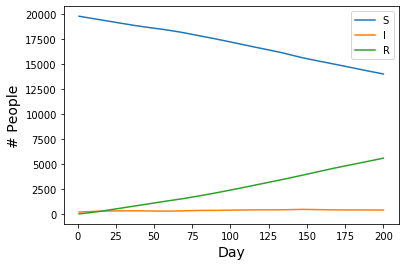

In [14]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO = generate_TM(list(range(locations)), city_map)

# restricting transition in case of lockdown
TMatrix=get_TM_lockdown(TMatrixO.copy(), 0.75)

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrix, pop_size, b, k, time, locations, infected_0, np.random.choice(locations, pop_size))

# Plots
plot_SIR(Stot, Itot, Rtot, pop_size)

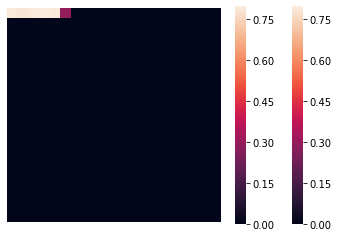

In [15]:
# Animations showing spread of disease
fig = plt.figure()

def init():
    data = np.reshape(I_time_ratio[0], (grid_size, grid_size))
    sns.heatmap(data, square=True, yticklabels = False, xticklabels=False)

t = 0
def animate(i):
    global t
    data = np.reshape(I_time_ratio[t], (grid_size, grid_size))
    t+=1
    if t >= time:
        t = 0
    sns.heatmap(data, square=True, cbar=False, yticklabels = False, xticklabels=False)
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=time, repeat = True)

HTML(anim.to_jshtml())

#### **Observation**
> 75% lockdown significantly reduced the spread of coronavirus. In 200 days only 30% population got infected and infection peaked with a value of only 470 at 146th day (44 days later than without lockdown case). We can also see in the heatmap animation, that the spread is very slow. Compared to the 100th day for 0 lockdown, 75% lockdown has very little spread on the 100th day with infections confined in a small area in the center-left part. Since 100% of full lockdown is not possible, we stopped our lockdown analysis at 75%. 

> With this analysis, we conclude that a small amount of lockdown (25%) will only reduce the impact of Covid-19 by a small amount. But as we increase the lockdown to above 50%, the effect will be significant in Flattening the curve.



---

### 5. Addition of one common place like supermarket which is visited by everyone

Assumptions made:

1.   For base case, we assume that there will no lockdown
2.   Everyone will visit the supermarket once a week. This is a valid assumption as people usually goes to supermarket in weekend





Initial infections complete...
Total people who got infected: 17707.0(88.5%)
Maximum infections present in a day: 3255 at day: 65


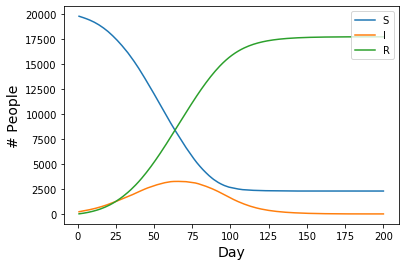

In [16]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO = generate_TM(list(range(locations)), city_map)

TMatrixComO = copy.deepcopy(TMatrixO)

# Making the middle location as common place
comm_loc = int(locations/2 + grid_size/2)
comm_freq = 1/7 # everyone goes there once a week
TMatrixComO[:, comm_loc] = 0 
TMatrixComO = (1-comm_freq)*TMatrixComO/TMatrixComO.sum(axis=1)[:,None]  

TMatrixComO[:, comm_loc] = comm_freq

# restricting transition in case of lockdown
TMatrixCom=get_TM_lockdown(TMatrixComO.copy(), 0)

# Calling the model function
possible_init_locations = list(range(comm_loc))+list(range(comm_loc+1, locations))
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrixCom.copy(), pop_size, b, k, time, locations, infected_0, np.random.choice(possible_init_locations, pop_size))

plot_SIR(Stot, Itot, Rtot, pop_size)

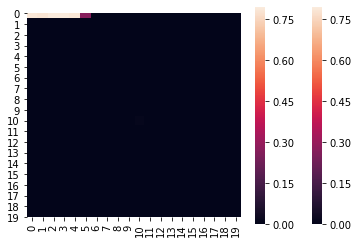

In [17]:
fig = plt.figure()

def init():
    data = np.reshape(I_time_ratio[0], (grid_size, grid_size))
    sns.heatmap(data, square=True)

t = 0
def animate(i):
    global t
    data = np.reshape(I_time_ratio[t], (grid_size, grid_size))
    sns.heatmap(data, square=True, cbar=False)
    t+=1

    if t >= time:
        t = 0
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=time, repeat = True)

HTML(anim.to_jshtml())

#### **Observation**
> Having a commonplace visited by everyone enabled the easy transfer of virus to all the parts of the city. Because of this, the peak of infections reached much earlier (on day 65) with higher active cases count of more than 3000 (around 800 more than our base case of experiment 1).

> In the heatmap, we can see that the center area got highlighted at the very beginning itself which helped in spreading the virus to different parts. On day 100, the spread crossed the diagonal part of the city (while in previous experiments spread never crossed the diagonal on day 100)

### 6. Now the common place was put in lockdown. That means no one was allowed to go to supermarket

Initial infections complete...
Total people who got infected: 18067.0(90.3%)
Maximum infections present in a day: 2518 at day: 105


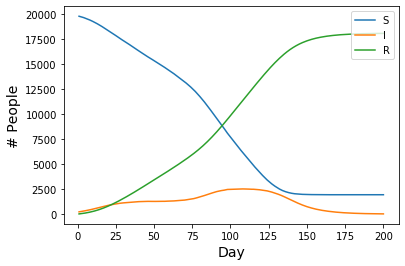

In [18]:
np.random.seed(seed_val)
TMatrixCom0 = copy.deepcopy(TMatrixCom)
TMatrixCom0[:, comm_loc] = 0
TMatrixCom0 = TMatrixCom0/TMatrixCom0.sum(axis=1)[:,None]  

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrixCom0, pop_size, b, k, time, locations, infected_0, np.random.choice(possible_init_locations, pop_size))

# Plot
plot_SIR(Stot, Itot, Rtot, pop_size)

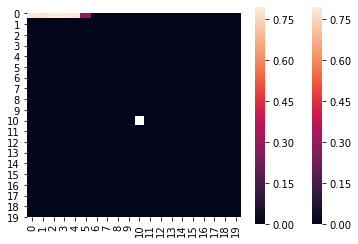

In [19]:
fig = plt.figure()

def init():
    data = np.reshape(I_time_ratio[0], (grid_size, grid_size))
    sns.heatmap(data, square=True)

t = 0
def animate(i):
    global t
    data = np.reshape(I_time_ratio[t], (grid_size, grid_size))
    sns.heatmap(data, square=True, cbar=False)
    t+=1

    if t >= time:
        t = 0
    
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=time, repeat = True)

HTML(anim.to_jshtml())


#### **Observation**
> After restricting the commonplace from visiting, the output became similar to the original experiment 1 with 0% lockdown. The highest peak of active cases was around 2500 on day 105. This time also we saw two plateaus on the line plot and similar heatmap animation.

### 7. When commonplace is the only place allowed to visit
Since the increase in infection was very slow for this experiment we increased the simulation time to 500 days

Initial infections complete...
Total people who got infected: 780.0(3.9%)
Maximum infections present in a day: 206 at day: 5


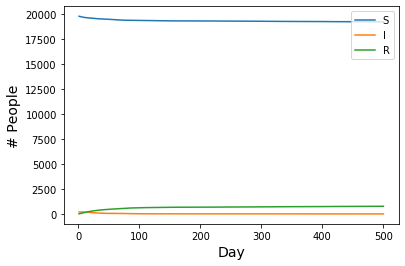

In [20]:
np.random.seed(seed_val)
TMatrixComO = np.zeros((locations, locations))

for i in range(locations):
    TMatrixComO[i,i] = 1-comm_freq
    TMatrixComO[i, comm_loc] = comm_freq

TMatrixComO[comm_loc, comm_loc] = 1

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrixComO, pop_size, b, k, 500, locations, infected_0, np.random.choice(possible_init_locations, pop_size))

# Plot
plot_SIR(Stot, Itot, Rtot, pop_size)

#### **Observation**
> This time the infection was very low. Since everyone was only allowed to move to one commonplace and that too even with a low probability, the infection was well contained.

### 8. Modeling two isolated cities connected with one route

We combined two cities through only one path and infected a small population in one of the cities. The transition probability matrix was created using the following steps:


1.   Transition matrix was created randomly for the two cities ($TM_{1}$ and $TM_{1}$)
2.   Both cities were combined into one large matrix:

     \begin{vmatrix}
        TM_{1} & 0 \\
        0 & TM_{2}
    \end{vmatrix}
3.   Center locations of both cities were selected as their airport
4.   Probability of all individual in a city to go to the airport was changed to $1/14$ (expecting people goes to another city once in two weeks)
5.   Transition matrix was normalized row-wise to make the sum of probabilities as 1

In [21]:
# Parameters

grid_size = 10 # City width 
locations = 2*grid_size*grid_size # total communities

pop_size = 20000
infected_0 = 100

city_map = np.reshape(list(range(grid_size*grid_size)), (grid_size, grid_size))

Initial infections complete...
Total people who got infected: 18885.0(94.4%)
Maximum infections present in a day: 4773 at day: 24


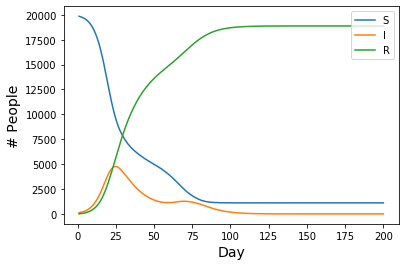

In [22]:
np.random.seed(seed_val)
# Generating random transition matrix
TMatrixO_1 = generate_TM(list(range(grid_size*grid_size)), city_map) # for city 1
TMatrixO_2 = generate_TM(list(range(grid_size*grid_size)), city_map) # for city 2

# both cities were combined into one large matrix
TMatrixO = np.block([[TMatrixO_1, np.zeros((grid_size*grid_size, grid_size*grid_size))],
          [np.zeros((grid_size*grid_size, grid_size*grid_size)), TMatrixO_2]])

# Location which has the city airport
city1port = int(grid_size*grid_size/2 + grid_size/2)
city2port = grid_size*grid_size + int(grid_size*grid_size/2 + grid_size/2)

# Updating the transition probability
city1portprob = TMatrixO[city1port, city1port]
city2portprob = TMatrixO[city2port, city2port]

TMatrixO[:, city1port] = 1/14
TMatrixO[:, city2port] = 1/14

TMatrixO[city1port, city1port] = city2portprob
TMatrixO[city2port, city2port] = city2portprob

# Normalizing the matrix columnwise to make sum of probabilities = 1
TMatrixO = TMatrixO/TMatrixO.sum(axis=1)[:,None]

# Calling the model function
Stot, Itot, Rtot, I_time_ratio, I_time = model_SIR(TMatrixO, pop_size, 0.5, 0.1, time, locations, infected_0, np.random.choice(locations, pop_size))

# Plot
plot_SIR(Stot, Itot, Rtot, pop_size)

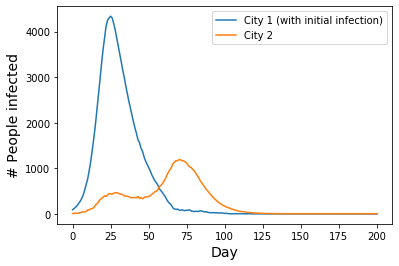

In [23]:
city1infected = []
city2infected = []
for i in range(len(I_time)):
    city1infected.append(sum(I_time[i][:grid_size*grid_size]))
    city2infected.append(sum(I_time[i][-grid_size*grid_size:]))


x = list(range(0, time+1))
plt.plot(x, city1infected, label="City 1 (with initial infection)")
plt.plot(x, city2infected, label="City 2")
plt.xlabel('Day', fontsize=14)
plt.ylabel('# People infected', fontsize=14)
plt.legend(loc="upper right")

In [24]:
def create_map(I_time_):
    city1 = np.reshape(I_time_[:grid_size*grid_size],  (grid_size, grid_size))
    city2 = np.reshape(I_time_[-grid_size*grid_size:],  (grid_size, grid_size))
    cities = np.block([[city1, np.zeros((grid_size, grid_size))],
          [np.zeros((grid_size, grid_size)), city2]])
    
    return cities


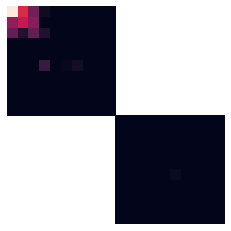

In [25]:
fig = plt.figure()

msk = np.block([[np.full((grid_size, grid_size), False), np.full((grid_size, grid_size), True)],
          [np.full((grid_size, grid_size), True), np.full((grid_size, grid_size), False)]])

t = 0
def animate(i):
    global t
    data = create_map(I_time_ratio[t][0])
    sns.heatmap(data, square=True, cbar=False, yticklabels = False, xticklabels=False, mask = msk)
    t+=1

    if t >= time:
        t = 0
    
anim = animation.FuncAnimation(fig, animate, frames=time, repeat = True)

HTML(anim.to_jshtml())

#### **Observation**
> We started the infection from the first city which spread to the second city. We can see the first city has the infection peak earlier with the highest active cases of around 4000. The second city got the peak late as it took some time for the virus to reach there. The magnitude of disease was also low with a more flatten curve in the second city as the disease spread was more gradual. This shows how 'Ground Zero' are more badly affected by an epidemic.

> We can see in the above animation, around day 25 one disease hotspot is being generated (which is the airport of city 2)

Note that we can't compare the active cases of this experiments with other experiments because the city size is different.

## Sources
[1] https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases

[2] https://www.worldometers.info/coronavirus/country/germany/

[3] https://www.webmd.com/lung/covid-recovery-overview#2-4

[4] https://en.wikipedia.org/wiki/Basic_reproduction_number